In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import seaborn as sns

In [ ]:
from keras.models import Sequential
from keras.models import Model
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers.core import Dropout
from keras.layers import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
import keras as K
import tensorflow as tf

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam,SGD,RMSprop

from skimage import io
import matplotlib.pyplot as plt

In [ ]:
url = 'https://github.com/ieee8023/deep-learning-datasets/tree/master/chihuahua-muffin'

!git clone https://github.com/ieee8023/deep-learning-datasets.git


Cloning into 'deep-learning-datasets'...
remote: Enumerating objects: 53, done.
remote: Total 53 (delta 0), reused 0 (delta 0), pack-reused 53
Unpacking objects: 100% (53/53), done.


In [ ]:
# install chromium, its driver, and selenium
!apt-get update -y
!apt install chromium-chromedriver -y
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
!pip install selenium
# set options to be headless, ..


Hit:1 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:4 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:5 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:6 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]
Get:7 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:8 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:9 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:11 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 Packages [3,098 kB]
Ign:12 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:13 https://developer.download.nvidia.com/com

In [ ]:
!apt-get update -y

!apt-get install -y libglib2.0-0=2.50.3-2 \
    libnss3=2:3.26.2-1.1+deb9u1 \
    libgconf-2-4=3.2.6-4+b1 \
    libfontconfig1=2.11.0-6.7+b1

Hit:1 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:4 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:5 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:6 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:7 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:8 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Hit:9 http://security.ubuntu.com/ubuntu bionic-security InRelease
Ign:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:13 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64

In [ ]:

train_ciwawa = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/chihuahua-*.jpg')
train_muffin = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/muffin-*.jpeg')


labels = ['ciwawa','muffin']

x=[]
y=[]

X_test = []
y_test = []


# print('length ciwawa',len(train_ciwawa))
for i in range(len(train_ciwawa)):
  url = train_ciwawa[i]
  image = io.imread(url)

  image = cv2.resize(image,(170,170))
  X_test.append(image)
  y_test.append(0)

for i in range(len(train_muffin)):
  url = train_muffin[i]
  image = io.imread(url)

  image = cv2.resize(image,(170,170))

  X_test.append(image)
  y_test.append(1)


In [ ]:
"""
Francesco Gerratana 2022, www.nextechnics.com
Simple example web scrape with python 3 and Selenium 4.1.3 + ChromeDriver 99.0.4844.51,
Run before pip install to install the necessary packages
"""
import time
import os
import urllib
import urllib.request
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options

chrome_options = Options()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

with webdriver.Chrome(options=chrome_options) as driver:

  driver.get('https://images.google.com/');
  time.sleep(5)

  try:
    bt = driver.find_element(by=By.ID, value='L2AGLb')
    bt.click()
    time.sleep(0.2)
  except:
    pass
    
  search_box = driver.find_element(by=By.NAME, value='q')
  search_box.send_keys('Muffin')
  search_box.submit()
  time.sleep(0.2)
    
    # dest = os.path.join(os.getcwd(),"img")
    # if not os.path.exists(dest):
    #     os.makedirs(dest)
   
  dest = '/content/deep-learning-datasets/chihuahua-muffin/google-muffin/'
  if not os.path.exists(dest):
        os.makedirs(dest)

  counter=0
  salvate=0

  for _ in range(8): # numero di scroll
      driver.execute_script("window.scrollBy(0,1000000)")      
  
      for d in driver.find_elements(by=By.XPATH, value='//img[contains(@class,"rg_i Q4LuWd")]'):
          
          counter = counter + 1
        
          if not d.get_attribute('src') == "": 
            url = d.get_attribute('src')            
            new_filename = dest+"\img-"+str(counter)+".jpg"
                
            try:
              urllib.request.urlretrieve(url, new_filename)
              salvate += 1
            except Exception as e:
              # print(e)
              pass

      time.sleep(0.2)

  print('trovate:'+str(counter)+' salvate:'+str(salvate))      
   
  driver.quit()



trovate:2248 salvate:1139


In [ ]:
"""
Francesco Gerratana 2022, www.nextechnics.com
Simple example web scrape with python 3 and Selenium 4.1.3 + ChromeDriver 99.0.4844.51,
Run before pip install to install the necessary packages
"""
import time
import os
import urllib
import urllib.request
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options

chrome_options = Options()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

with webdriver.Chrome(options=chrome_options) as driver:

  driver.get('https://images.google.com/');
  time.sleep(5)

  try:
    bt = driver.find_element(by=By.ID, value='L2AGLb')
    bt.click()
    time.sleep(0.2)
  except:
    pass

  search_box = driver.find_element(by=By.NAME, value='q')
  search_box.send_keys('Chihuahua dog')
  search_box.submit()
  time.sleep(0.2)

  counter = 0
  salvate = 0
    
    # dest = os.path.join(os.getcwd(),"img")
    # if not os.path.exists(dest):
    #     os.makedirs(dest)
   
  dest = '/content/deep-learning-datasets/chihuahua-muffin/google-cihuahua/'
  if not os.path.exists(dest):
        os.makedirs(dest)

  for _ in range(8): # numero di scroll
      driver.execute_script("window.scrollBy(0,100000)")    
  
      for d in driver.find_elements(by=By.XPATH, value='//img[contains(@class,"rg_i Q4LuWd")]'):
          
          counter = counter + 1
        
          if not d.get_attribute('src') == "": 
            url = d.get_attribute('src')            
            new_filename = dest+"\img-"+str(counter)+".jpg"
                
            try:
              urllib.request.urlretrieve(url, new_filename)
              salvate += 1
            except Exception as e:
              # print(e)
              pass

      time.sleep(0.2)

  print('trovate:'+str(counter)+' salvate:'+str(salvate))

  driver.quit()



trovate:2248 salvate:1099


In [ ]:
google_ciwawa = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/google-cihuahua/*.jpg')

for i in range(len(google_ciwawa)):
  url = google_ciwawa[i]
  image = io.imread(url) # qui hai il problema devi convertire in BGR
  # print(google_ciwawa[i])
  # print(image.shape)

  if len(image.shape)==3:
      image = cv2.resize(image,(170,170))
      x.append(image)
      y.append(0)

#print(len(x))

In [ ]:
google_muffin = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/google-muffin/*.jpg')

for i in range(len(google_muffin)):
  url = google_muffin[i]
  image = io.imread(url) # qui hai il problema

  # print(google_muffin[i])
  # print(image.shape)
  if len(image.shape)==3:
    image = cv2.resize(image,(170,170))
    x.append(image)
    y.append(1)

#print(len(x))

In [ ]:
x = np.asarray(x)  
x= x / 255
y = np.asarray(y)


X_test = np.asarray(X_test)
X_test = X_test / 255
y_test = np.asarray(y_test)

In [ ]:
print(len(x))

2217


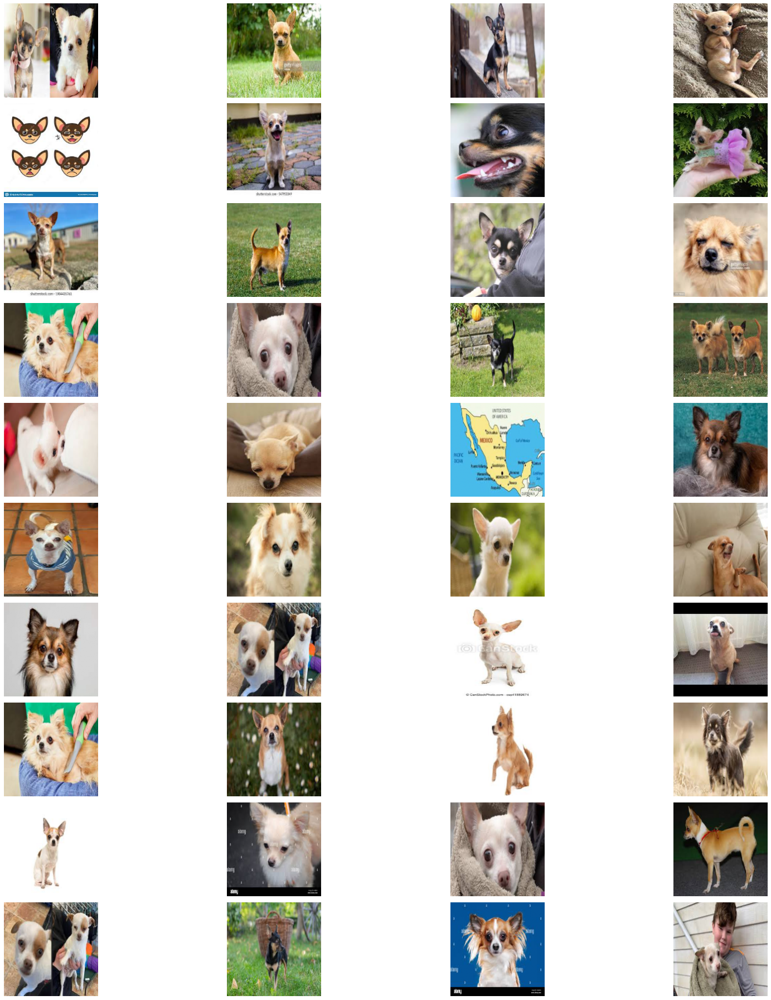

In [ ]:
fig = plt.figure(figsize=(25, 25))

columns = 4
rows = 10

total_pics = columns*rows

for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)

  plt.imshow(x[i])
  plt.axis('off')
plt.tight_layout()

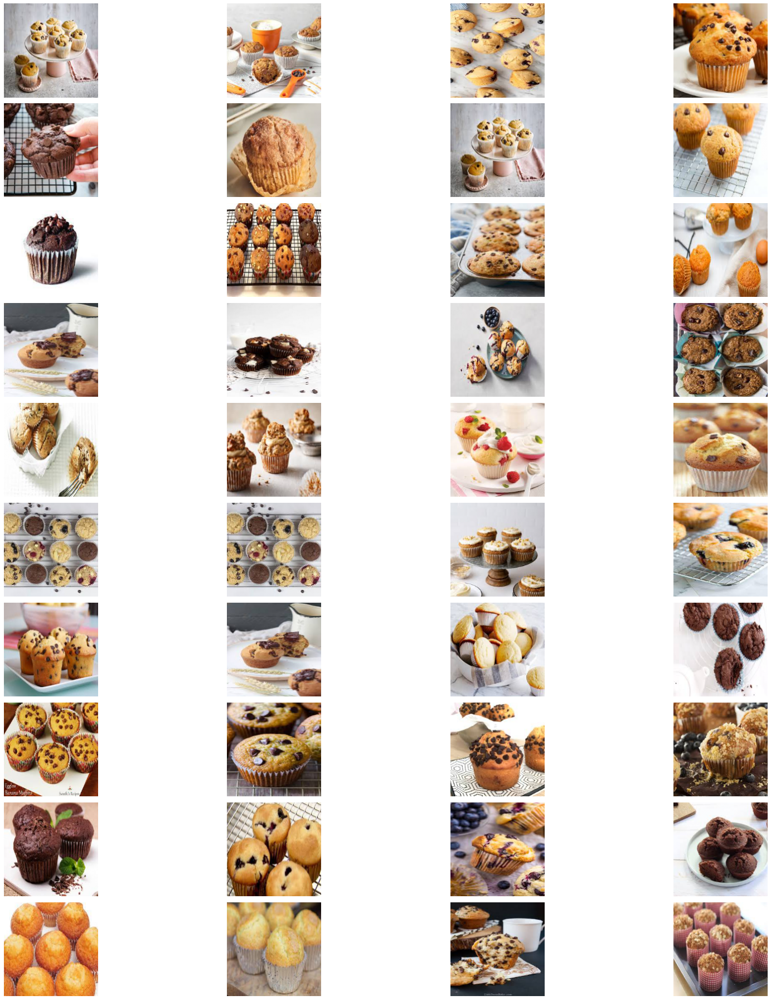

In [ ]:
fig = plt.figure(figsize=(25, 25))

columns = 4
rows = 10

total_pics = columns*rows

res = x[-total_pics:]

for i in range(len(res)):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)

  plt.imshow(res[i])
  plt.axis('off')
plt.tight_layout()



In [ ]:

checkPoint=ModelCheckpoint("model.h5", save_weights_only=False, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
earlyStopping=EarlyStopping(monitor='val_loss', min_delta = 0.01, patience=15, verbose=0, mode='min') 
# earlyStopping=EarlyStopping(monitor='loss', min_delta = 0, patience=10, verbose=1, mode='min', restore_best_weights = True) 

lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose=1, factor=0.5, min_lr=2.5e-5)
# reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=5, min_lr=0.001)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience = 2, verbose=1,factor=0.3, min_lr=0.0001)


In [ ]:
shape = (170, 170, 3)
target_size = (170, 170)

input_tensor = K.Input(shape=shape)
adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.9999, decay=0.0)


def create_model():   

  model = Sequential(
          [   
              # K.layers.Lambda(lambda image: tf.image.resize(image, target_size)),
              Conv2D(3, (3,3), padding="same", input_shape=shape, activation='relu'),
              Conv2D(3, (3,3), padding="same", activation='relu'),
              Conv2D(3, (1,1), padding="same", activation='relu'),
              BatchNormalization(),
              Conv2D(6, (3,3), activation='relu', strides=3),

              Conv2D(6, (3,3), padding="same", activation='relu'),
              Conv2D(6, (3,3), padding="same", activation='relu'),
              Conv2D(6, (1,1), padding="same", activation='relu'),
              BatchNormalization(),
              MaxPooling2D(pool_size=(2, 2)),
              Dropout(0.25),

              Flatten(),
              Dense(6,activation='relu'),
              BatchNormalization(),
              Dropout(0.5),
              Dense(1,activation='sigmoid')

          ], name="my-net"
      )
  model.compile(loss='binary_crossentropy', optimizer=adam, metrics = ['accuracy'])
  model.build((None,170,170,3))
  return model
  

In [ ]:
model = create_model()
model.summary()

Model: "my-net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 170, 170, 3)       84        
                                                                 
 conv2d_1 (Conv2D)           (None, 170, 170, 3)       84        
                                                                 
 conv2d_2 (Conv2D)           (None, 170, 170, 3)       12        
                                                                 
 batch_normalization (BatchN  (None, 170, 170, 3)      12        
 ormalization)                                                   
                                                                 
 conv2d_3 (Conv2D)           (None, 56, 56, 6)         168       
                                                                 
 conv2d_4 (Conv2D)           (None, 56, 56, 6)         330       
                                                            

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(x, y, test_size=0.2, random_state=1)

# X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [ ]:
from keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(   shear_range = 0.2,
                                  zoom_range = 0.5,
                                  height_shift_range=0.2,
                                  width_shift_range=0.2,
                                  fill_mode='nearest',
                                  horizontal_flip=True,
                                  rotation_range = 20, 
                            
                               )


validation_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(X_train, y_train, batch_size=6)
validation_generator = validation_datagen.flow(X_val,y_val, batch_size=6)


In [ ]:
history = model.fit(train_generator,    
                    validation_data= validation_generator,
                    validation_steps=len(X_val) // 6,
                    steps_per_epoch=len(X_train) // 6,
                    epochs=200,
                    callbacks = [lrr,checkPoint,earlyStopping],
                    shuffle=True,
                    verbose=2)
model.save('last.h5')

Epoch 1/200

Epoch 1: val_accuracy improved from -inf to 0.45270, saving model to model.h5
295/295 - 25s - loss: 1.0012 - accuracy: 0.5133 - val_loss: 0.8389 - val_accuracy: 0.4527 - lr: 1.0000e-04 - 25s/epoch - 85ms/step
Epoch 2/200

Epoch 2: val_accuracy improved from 0.45270 to 0.47297, saving model to model.h5
295/295 - 14s - loss: 0.8936 - accuracy: 0.5563 - val_loss: 0.7949 - val_accuracy: 0.4730 - lr: 1.0000e-04 - 14s/epoch - 48ms/step
Epoch 3/200

Epoch 3: val_accuracy improved from 0.47297 to 0.69144, saving model to model.h5
295/295 - 15s - loss: 0.8553 - accuracy: 0.5710 - val_loss: 0.6980 - val_accuracy: 0.6914 - lr: 1.0000e-04 - 15s/epoch - 51ms/step
Epoch 4/200

Epoch 4: val_accuracy improved from 0.69144 to 0.69595, saving model to model.h5
295/295 - 14s - loss: 0.7791 - accuracy: 0.5846 - val_loss: 0.6862 - val_accuracy: 0.6959 - lr: 1.0000e-04 - 14s/epoch - 47ms/step
Epoch 5/200

Epoch 5: val_accuracy improved from 0.69595 to 0.74099, saving model to model.h5
295/295 -

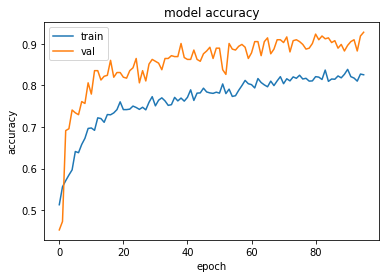

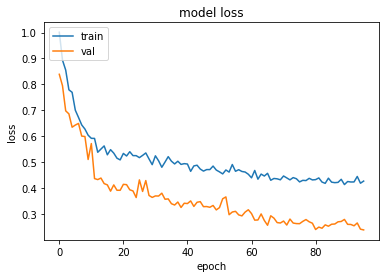

last model accuracy 0.9279279112815857
best model accuracy 0.9279279112815857


In [ ]:
import matplotlib.pyplot as plt
import numpy as np


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

index = np.argmax(history.history['val_accuracy'])

print('last model accuracy',history.history['val_accuracy'][-1])
print('best model accuracy',history.history['val_accuracy'][index])



In [ ]:
model = K.models.load_model("model.h5")


In [ ]:
model = K.models.load_model("last.h5")

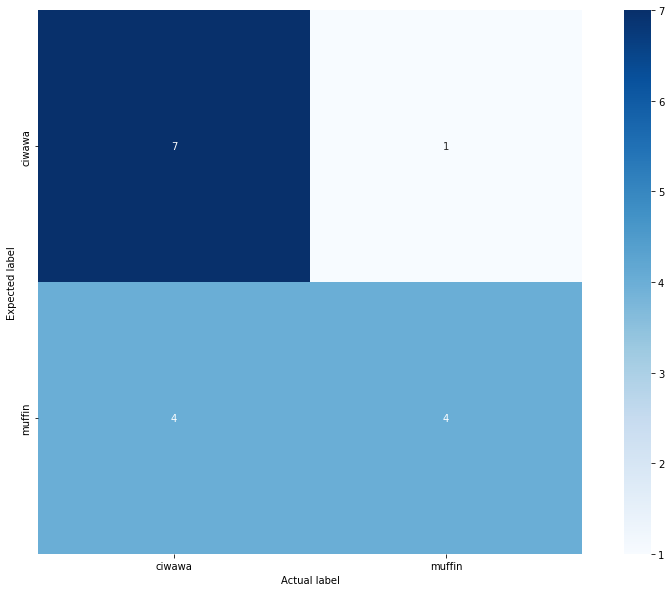

              precision    recall  f1-score   support

      ciwawa       0.64      0.88      0.74         8
      muffin       0.80      0.50      0.62         8

    accuracy                           0.69        16
   macro avg       0.72      0.69      0.68        16
weighted avg       0.72      0.69      0.68        16



,predictions,actual_values
0,ciwawa,ciwawa
1,ciwawa,ciwawa
2,ciwawa,ciwawa
3,ciwawa,ciwawa
4,muffin,ciwawa


,predictions,actual_values
4,muffin,ciwawa
8,ciwawa,muffin
9,ciwawa,muffin
12,ciwawa,muffin
15,ciwawa,muffin


n° of failing predictions: 5
accuracy: 0.6875


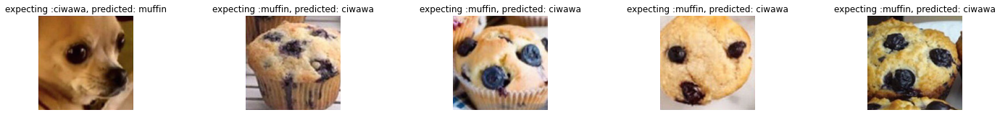

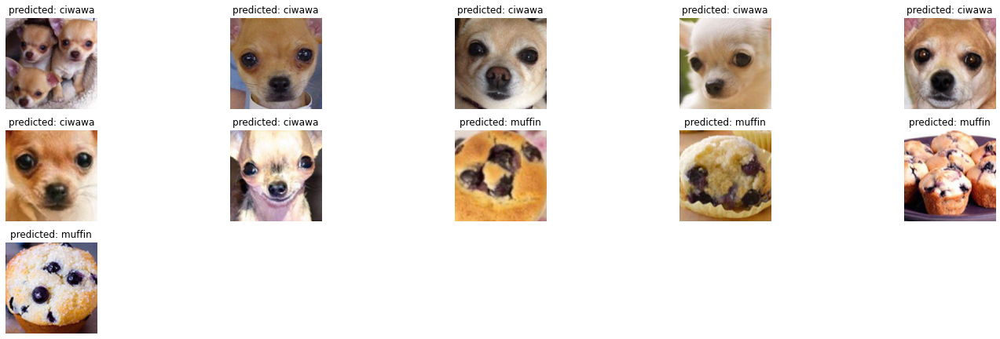

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report
import pandas as pd
import seaborn as sns
import tensorflow.keras as K

# labels = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

pred = model.predict(X_test)

# print(pred[:,0])

predictions = (np.round(pred[:,0]))

# print(len(predictions))
# print(len(y_test))


df = pd.DataFrame({'predictions':predictions,'actual_values':y_test})

df['predictions']=df['predictions'].apply(lambda x: labels[int(x)] )
df['actual_values']=df['actual_values'].apply(lambda x: labels[x] ) 

expected = df['predictions'].to_numpy()
actual = df['actual_values'].to_numpy()

# # print(expected[:10])
# # print(actual[:10])

cm=confusion_matrix(actual,expected)

plt.figure(figsize=[15, 10])
sns.heatmap(data=cm, annot=True, cmap='Blues', square=True, xticklabels=labels, yticklabels=labels)
plt.xlabel('Actual label')
plt.ylabel('Expected label')
plt.show()

print( classification_report(actual,expected))

display(df.head())

failings = df[df['predictions']!=df['actual_values']]
corrects = df[df['predictions']==df['actual_values']]

display(failings.head())

failing_predictions = len(failings)

print('n° of failing predictions:',failing_predictions)
# print(failings.index[0])
total_data = len(df)

print('accuracy:',1 - failing_predictions / total_data)
# print('accuracy:',model.evaluate(X_test, y_test, batch_size=256))

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(failings)
# print(failings.iloc[failings.index[0]])

# (X_train, y_train), (X_test, y_test) = K.datasets.cifar10.load_data()
for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = failings.iloc[i]
  ax.set_title('expecting :'+str(el.actual_values)+", predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[failings.index[i]])
  plt.axis('off')
plt.tight_layout()

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(corrects)

for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = corrects.iloc[i]
  ax.set_title("predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[corrects.index[i]])
  plt.axis('off')
plt.tight_layout()

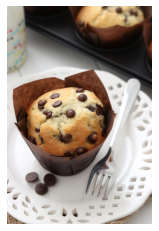

[[0.8620435]]
muffin


In [ ]:
url_1 ='https://uitdekeukenvanfatima.nl/wp-content/uploads/2018/03/IMG_4654-2.jpg'

image_1 = io.imread(url_1)
plt.imshow(image_1)
plt.axis('off')
plt.show()

image_1 = cv2.resize(image_1,(170,170))
image_1 = image_1 /255
pred = model.predict(np.array([image_1]))

print(pred)

index = int(np.round(pred[0]))
print(labels[index])


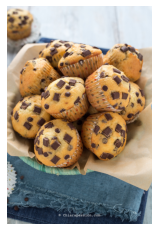

[[0.9749912]]
muffin


In [ ]:
url = 'https://www.chiarapassion.com/wp-content/uploads/2019/01/ricetta-muffin-con-gocce-di-cioccolato.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.resize(image,(170,170))
image = image / 255
pred = model.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))
print(pred)
print(labels[index])

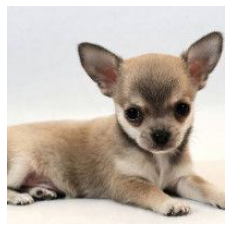

[[0.21017003]]
ciwawa


In [ ]:
url = 'https://i.pinimg.com/236x/a7/f3/21/a7f3211d31c7f2b1572ba12105e61eac.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.resize(image,(170,170))
image = image /255

pred = model.predict(np.array([image]))

index = int(np.round(pred[0]))
print(pred)
# print(index)
print(labels[index])

[0.86467516]
muffin


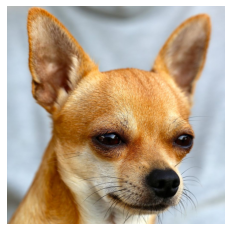

In [ ]:
url = 'https://www.allevare.info/wp-content/uploads/2019/09/chihuahua-1.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')


image = cv2.resize(image,(170,170))
image = image / 255
pred = model.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))

print(pred[0])
# print(index)
print(labels[index])

[0.06262124]
ciwawa


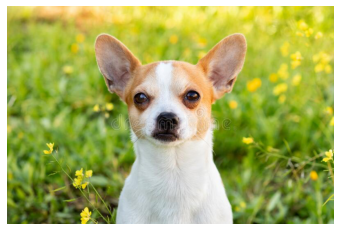

In [ ]:
url_2 = 'https://thumbs.dreamstime.com/b/funny-white-chihuahua-big-ears-funny-white-chihuahua-big-ears-bloosom-meadow-169312889.jpg'

image = io.imread(url_2)
plt.imshow(image)
plt.axis('off')


image = cv2.resize(image,(170,170))
image = image / 255
pred = model.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))

print(pred[0])
# print(index)
print(labels[index])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


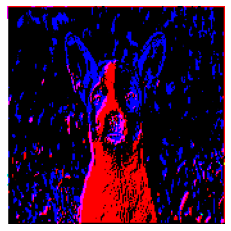

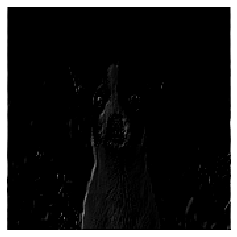

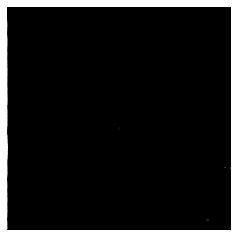

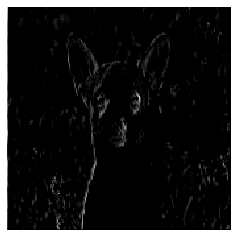

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


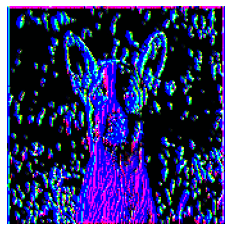

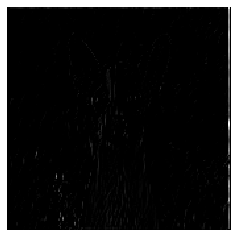

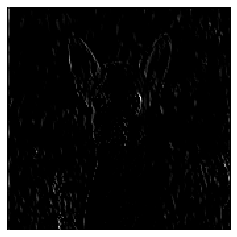

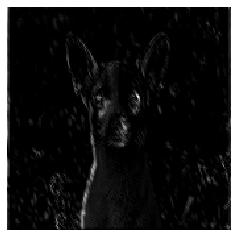

In [ ]:
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

imagex = io.imread(url_2)
imagex = cv2.resize(imagex,(170,170))

imagex= np.expand_dims(imagex, axis=0)

activations = activation_model.predict(imagex) # feature of this picture
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.imshow(first_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 0], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 1], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.imshow(second_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 0], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 1], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

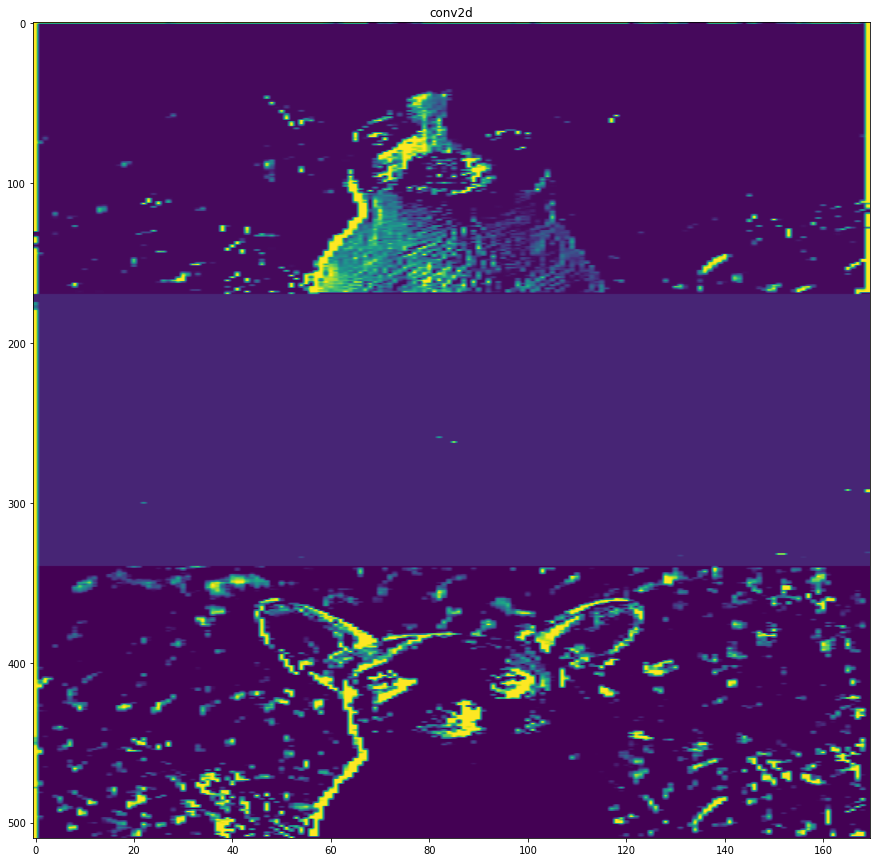

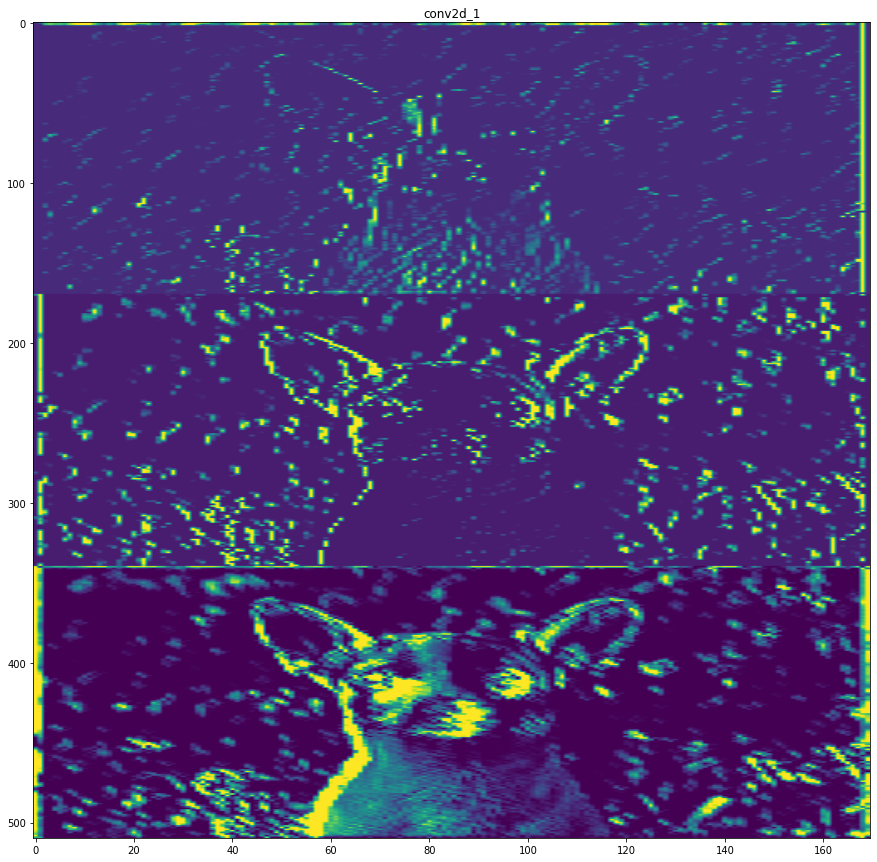

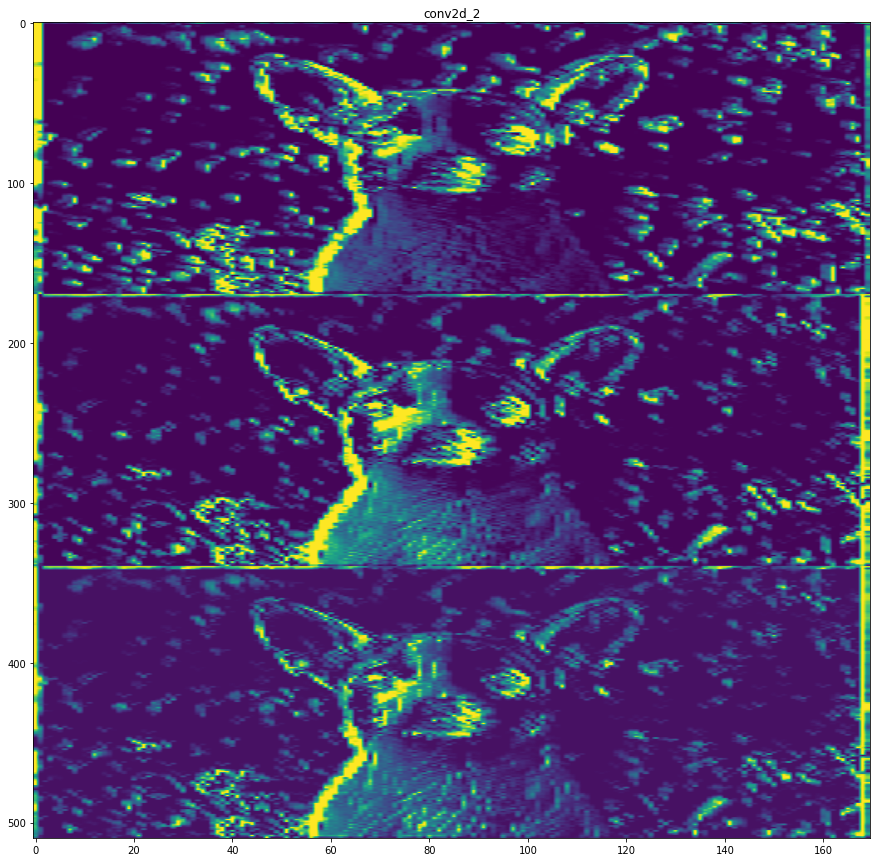

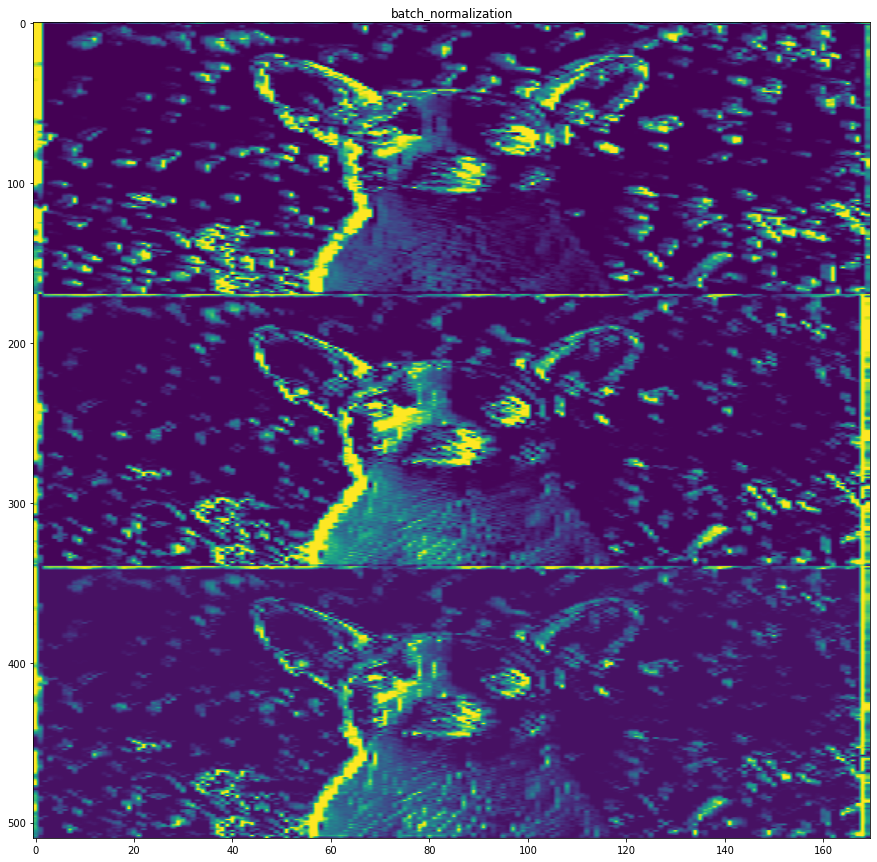

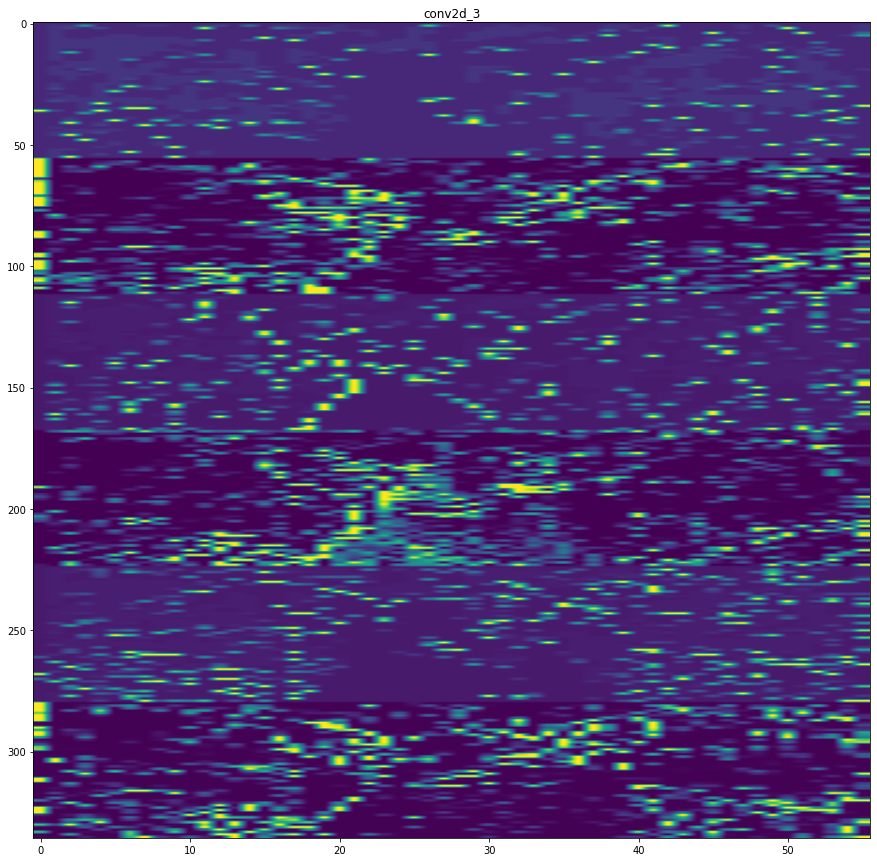

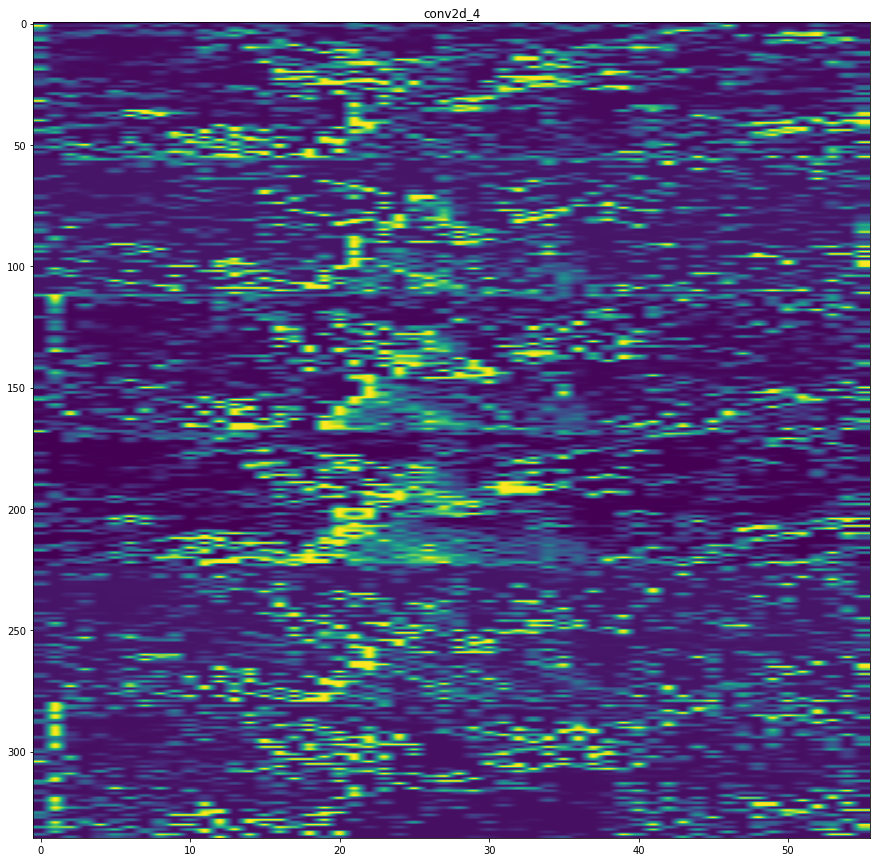

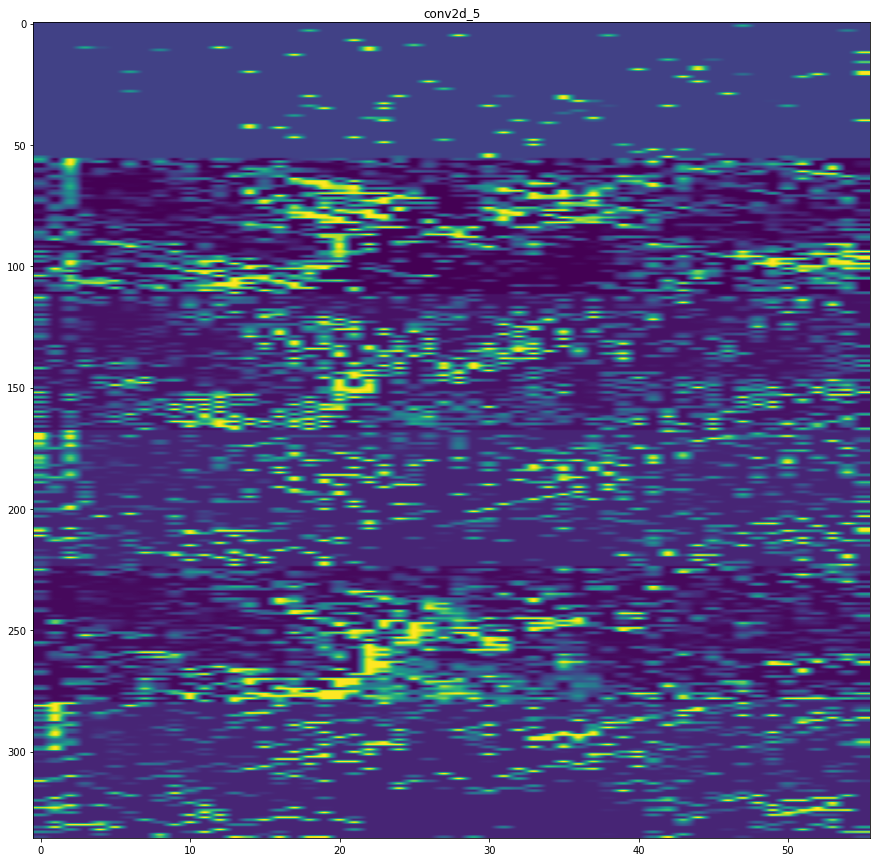

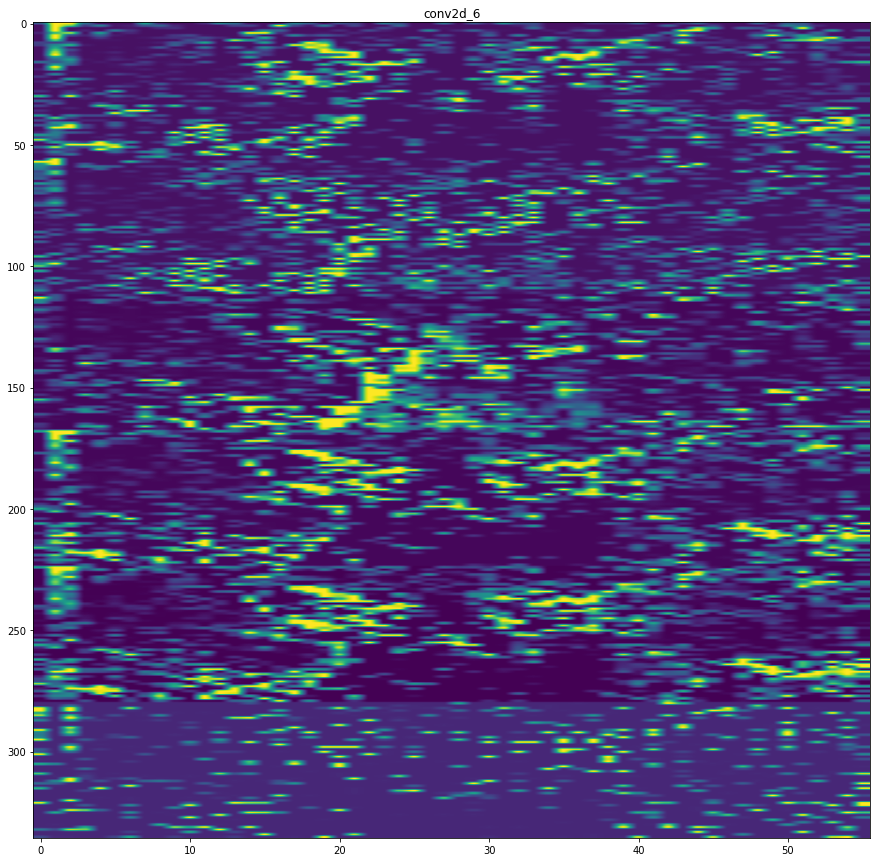

In [ ]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 1

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(15,15))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

In [ ]:
imagex = io.imread(url_1)
imagex = cv2.resize(imagex,(170,170))

imagex= np.expand_dims(imagex, axis=0)

imagex = imagex /255

activations = activation_model.predict(imagex) # feature of this picture
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.imshow(first_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 0], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 1], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.imshow(second_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 0], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 1], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()